### Importing Libraries and Datasets

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud

import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\parij\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\parij\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [55]:
data = pd.read_csv('fakenews.csv',index_col=0)
data.head()

,title,author,text,label
id,,,,
0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


### Data preprocessing

In [56]:
data.shape

(20800, 4)

In [57]:
df = data.drop(['text'], axis=1)
df.head()

,title,author,label
id,,,
0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,1
1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,0
2,Why the Truth Might Get You Fired,Consortiumnews.com,1
3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,1
4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,1


In [58]:
df.isnull().sum()

title      558
author    1957
label        0
dtype: int64

In [59]:
df = df.fillna('')
df.isnull().sum()

title     0
author    0
label     0
dtype: int64

In [60]:
# Shuffling
df = df.sample(frac=1) # Return a random sample of items from an axis of object.
print(df.head())
df.reset_index(inplace=True) # Reset index positions
print(df.head())
df.drop(["id"], axis=1, inplace=True) # Drop 'id' column
print(df.head())

                                                   title   
id                                                         
327    Donald Trump Holds ‘Thank You’ Rally in Cincin...  \
17478  Boy With Autism Makes His First Friend Ever An...   
17720  Pakistan declares nationwide bandh on November...   
6031                                  Why Obama Will Win   
13461  ’The Most Trusted National Leader Today’: 80 P...   

                                                  author  label  
id                                                               
327    Gardiner Harris, John Schwartz, Jackie Calmes ...      0  
17478                                    Brianna Acuesta      1  
17720                                       Ashwin Kumar      1  
6031                                        Jared Taylor      1  
13461                                     Frances Martel      0  
      id                                              title   
0    327  Donald Trump Holds ‘Thank You’ Rally in Cinc

In [61]:
df['label'].value_counts()

label
1    10413
0    10387
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

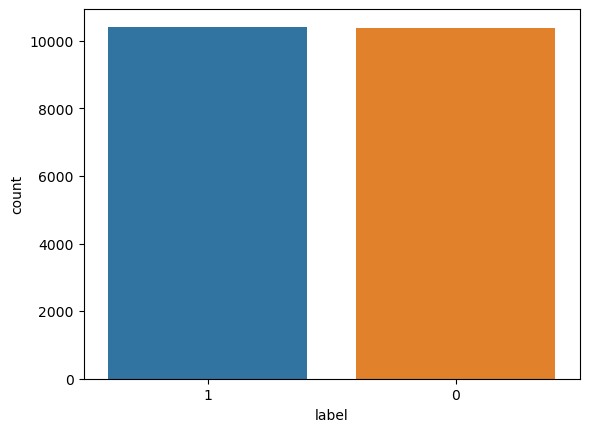

In [62]:
sns.countplot(data=df,
              x='label',
              order=df['label'].value_counts().index)

### Preprocessing and analysis of News column

Firstly we will remove all the stopwords, punctuations and any irrelevant spaces from the text. For that **NLTK Library** is required. We can create a function name preprocess_text. This function will preprocess all the data given as input.

In [65]:
def preprocess_text(text_data):
    text_data = re.sub('[^a-zA-Z]', ' ', text_data)
    sentence = []
    for word in text_data.split():
        if word not in stopwords.words('english'):
            word = word.lower()
            sentence.append(word)
    sentence = ' '.join(sentence)
    return sentence

To implement the function in all the news in the **title** column

In [66]:
for i in range(len(df)):
    df['title'][i] = preprocess_text(df['title'][i])

# This command  will take some time (as the dataset taken is very large).
df.head()

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'][i] = preprocess_text(df['title'][i])
C:\Users\parij\AppData\Local\Temp\ipykernel_19528\3808670423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df

,title,author,label
0,donald trump holds thank you rally cincinnati ...,"Gardiner Harris, John Schwartz, Jackie Calmes ...",0
1,boy with autism makes his first friend ever an...,Brianna Acuesta,1
2,pakistan declares nationwide bandh november th...,Ashwin Kumar,1
3,why obama will win,Jared Taylor,1
4,the most trusted national leader today percent...,Frances Martel,0


Let’s visualize the WordCloud for fake and real news separately.

In [67]:
real_news = ' '.join(word for word in df['title'][df['label']==1].astype(str))
real_word_cloud = WordCloud(width = 1500, height = 750, random_state = 21, max_font_size = 110, collocations = False)

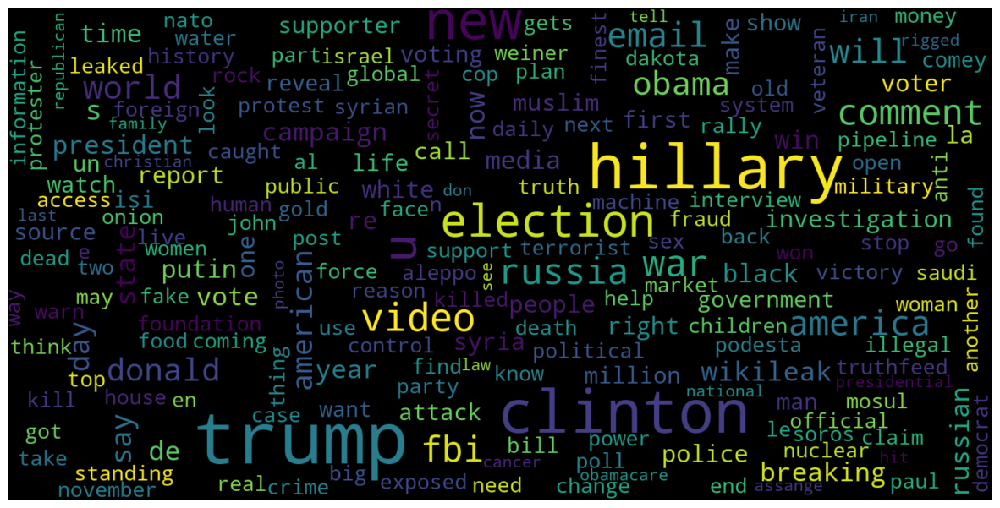

In [68]:
plt.figure(figsize = (15,10))
plt.imshow(real_word_cloud.generate(real_news), interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [69]:
fake_news = ' '.join(word for word in df['title'][df['label']==0].astype(str))
fake_word_cloud = WordCloud(width = 1500, height = 750, random_state = 21, max_font_size = 110, collocations = False)

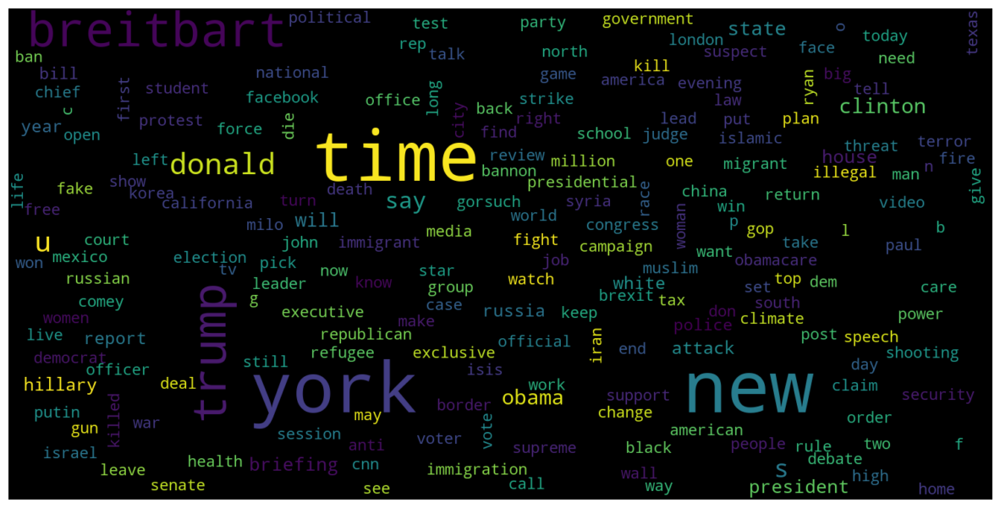

In [70]:
plt.figure(figsize = (15,10))
plt.imshow(fake_word_cloud.generate(fake_news), interpolation = 'bilinear')
plt.axis('off')
plt.show()

Let’s plot the bargraph of the top 20 most frequent words.

In [72]:
word_freq = {}
for i in range(len(df)):
    all_words = df['title'][i].split()
    for word in all_words:
        if word not in word_freq:
            word_freq[word] = 1
        else:
            word_freq[word] = word_freq[word] + 1

word_freq = sorted(word_freq.items(), key = lambda x:x[1], reverse=True)

i = 0
for word in word_freq:
    if len(word[0]) <= 1:
        word_freq.remove(word)
    i = i + 1

print(len(word_freq))

df1 = pd.DataFrame(word_freq, columns = ['value', 'value_count'])
df1.head(20)

21214
the
3
new
3
york
4
times
5
trump
5
breitbart
9
is
2
hillary
7
clinton
7
to
2
a
1
a *
donald
6
with
4
it
2
u
1
u *
for
3
election
8
of
2
obama
5
after
5
news
4
will
4
what
4
russia
6
are
3
you
3
how
3
from
4
not
3
your
4
us
2
that
4
i
1
i *
on
2
war
3
america
7
over
4
be
2
says
4
about
5
this
4
and
3
president
9
world
5
fbi
3
we
2
state
5
no
2
his
3
up
2
why
3
comment
7
who
3
have
4
media
5
out
3
he
2
house
5
police
6
has
3
white
5
can
3
more
4
day
3
report
6
now
3
campaign
8
just
4
syria
5
first
5
one
3
bill
4
against
7
was
3
american
8
anti
4
at
2
briefing
8
people
6
russian
7
black
5
all
3
as
2
man
3
attack
6
her
3
vote
4
may
3
they
4
putin
5
watch
5
if
2
life
4
de
2
could
5
emails
6
wikileaks
9
time
4
breaking
8
back
4
down
4
get
3
year
4
n
1
n *
china
5
isis
4
years
5
calls
5
women
5
their
5
say
3
comey
5
democrats
9
fake
4
health
6
obamacare
9
government
10
court
5
into
4
big
3
investigation
13
case
4
when
4
top
3
email
5
by
2
border
6
should
6
re
2
million
7
right
5
plan
4


,value,value_count
0,the,8590
1,new,7119
2,york,6373
3,times,6354
4,trump,3729
5,breitbart,2402
6,is,1364
7,hillary,1264
8,clinton,1217
9,to,1098


<Axes: title={'center': 'Bar Chart of Top Words Frequency'}, xlabel='Top Words', ylabel='Count'>

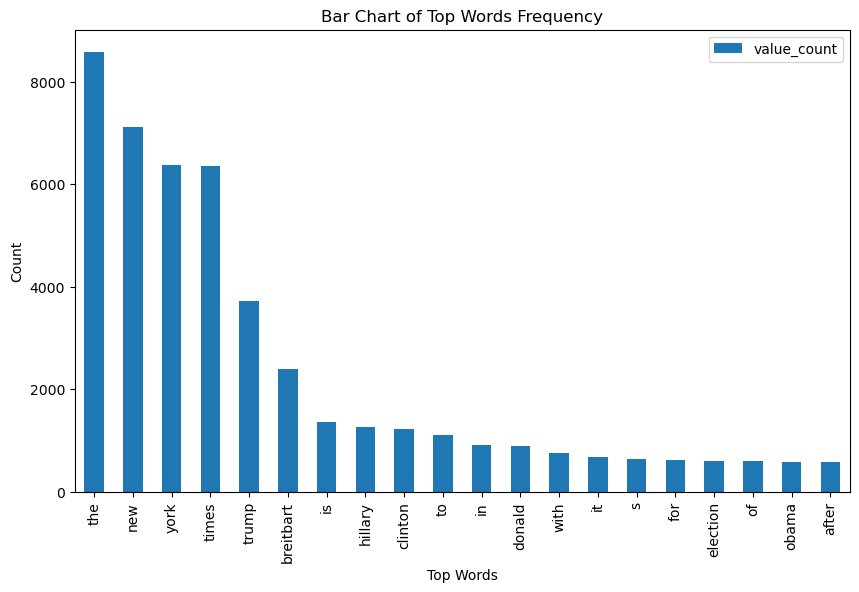

In [73]:
df1[:20].set_index(df1['value'][:20]).plot(kind = 'bar',
         figsize=(10, 6),
         xlabel="Top Words",
         ylabel="Count",
         title="Bar Chart of Top Words Frequency"
        )

### Converting text into Vectors

Our last preprocessing step would be to transform our textual X to numerical so that our ML model can understand it and can work with it. This is where **TfidfVectorizer** comes into play.

In [74]:
#Next step is to name our input and output features
X = df.title.values
y = df.label.values

In [75]:
X1 = TfidfVectorizer().fit_transform(X)
print(X1)

  (0, 19012)	0.09278345386457222
  (0, 21069)	0.09306575589402254
  (0, 12591)	0.08995269917720014
  (0, 18857)	0.0829834915068172
  (0, 16665)	0.2853243027319919
  (0, 4728)	0.3041040582528451
  (0, 13910)	0.2914325737072498
  (0, 8720)	0.21729900926864051
  (0, 744)	0.3071664873407073
  (0, 3273)	0.3952207463125754
  (0, 15032)	0.2742630938648057
  (0, 21075)	0.20439427758668854
  (0, 18846)	0.34869984681284194
  (0, 8777)	0.35814889342535255
  (0, 19416)	0.11588675210622469
  (0, 5516)	0.1757023062580184
  (1, 4335)	0.3485013211708586
  (1, 18034)	0.24360244297527464
  (1, 2713)	0.20267921038637327
  (1, 12043)	0.3078354712098816
  (1, 680)	0.1941897587681654
  (1, 6429)	0.25986587759973173
  (1, 7454)	0.3078354712098816
  (1, 7074)	0.20818291053315313
  (1, 11238)	0.253179560240969
  :	:
  (20796, 21069)	0.0962461978020534
  (20796, 12591)	0.093026755057963
  (20796, 18857)	0.08581938072866531
  (20796, 19416)	0.11984708186923576
  (20797, 4857)	0.6033238201335955
  (20797, 7730)	0

**Splitting the Dataset**

In [86]:
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size = 0.2, stratify = y, random_state = 2)

This means that we have divided our dataset into **80%** as training set and **20%** as test set. **stratify = y** implies that we have made sure that the division into train-test sets have around equal distribution of either classes (0 and 1 or Real and Fake). **random_state = 2** will guarantee that the split will always be the same.

### Training the Model

Fitting the model to our dataset

In [87]:
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

Now that we have trained it, let’s check the accuracy of our training set predictions

In [88]:
X_train_prediction = model.predict(X_train)
training_accuracy = accuracy_score(X_train_prediction, y_train)
print(training_accuracy)

0.9457331730769231


So I got about **94.57%**, which is pretty good. Similarly for the test dataset.

In [89]:
X_test_prediction = model.predict(X_test)
testing_accuracy = accuracy_score(X_test_prediction, y_test)
print(testing_accuracy)

0.921875


So test accuracy is also pretty good.

**Building a system**

In [93]:
X_sample = X_test[100]

In [94]:
#Checking our prediction for this sample,

prediction = model.predict(X_sample)
if prediction == 0:
    print('The NEWS is Real!')
else:
    print('The NEWS is Fake!')

The NEWS is Real!


In [95]:
y_test[100]

0